# Assignment 3: LDA Topic Modeling

## Note
Installing Tomotopy locally can return an error, if that's the case run this notebook on Google Colab

## Research Background

LDA is a popular topic modeling algorithm widely used in the fields of Digital Humanities and Social Sciences. In the field of political communication, topic modeling is often applied for analyzing politicians Twitter/X posts, identitying thematic patterns or topics revolving around their posts.

For this assignment, students will work with tweets from two USA politicians, Donald Trump and Bernie Sanders, who are often regarded as right-wing populist and left-wing populist respectively. Right-wing populism often emphasizes nationalism, anti-immigration policies, and a critique of global elites from a culturally conservative perspective, focusing on preserving traditional values and social hierarchies. Left-wing populism prioritizes economic inequality, advocating for the redistribution of wealth, expansion of social services, and empowerment of the working class against the capitalist elite. While both forms of populism appeal to the "common people" against perceived elites and established structures, they diverge significantly in their identification of the elites, proposed solutions, and core ideologies. For a more detailed explanation, you can read the chapter by Macaulay (2019) "Bernie and The Donald: A comparison of left-and right-wing populist discourse" (full reference below).

**Research Questions**
1. What topics are revolving around Donald Trump and Bernie Sanders' posts separately?
2. What are the topic differences between Trump (right-wing popoulist) and Sanders (left-wing populist)?

**Aim:**
1. The first aim of the assignment is to conduct LDA topic modeling. Identify thematic patterns or politics revolving around Trump or Sanders's posts.
2. The second aim is to critically evaluate the results of topic modeling. Try different numbers of topics to see with which settings the topics are more coherent. Critically reflect on the results of LDA topic modeling, discussing them in relation to existing theories about populism.

**Data**
Two datasets are prepared for this assginment. Tweets from Trump and tweets from Sanders. Students are asked to work on these two datasets.

**Methods**
1. Word segamentation
2. Removing stopwords
3. LDA topic modeling
4. Topic evaulation (coherence and human evaluation)
5. Visualization of results.

**References**
1. Macaulay, M. (2019). Bernie and the Donald: A comparison of Left-and Right-wing populist discourse. *Populist discourse: International perspectives*, 165-195.





## Setup

### Q1. Install necessary libraries, including `tomotopy` and `little_mallet_wrapper`, and import them

In [2]:
# Q1 (code)
! pip install tomotopy
! pip install little_mallet_wrapper

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [4]:
import tomotopy as tp # import it for Topic Modeling
import little_mallet_wrapper # import it for processing texts, such as remove stopwords, punctuation, and numbers
import pandas as pd # import it for manipulating data
import re # import the regular expressions library re to remove the words, such as URLS and user mentions
from IPython.display import Markdown, display # import it to generate Markdown output
import matplotlib.pyplot as plt # import it to draw the heatmap
import seaborn as sns # import it to draw the heatmap
from random import sample # import it to randomly select sample of the whole dataset 

### Q2. Load the two datasets and concatenate them

The goal is to run topic modelling on the combined dataset of Sanders and Trump's tweets

In [140]:
# Q2 (code)
sanders = pd.read_csv('sanders_tweets.csv') # load tweets from Bernie Sanders
trump = pd.read_csv('trump_tweets.csv') # load tweets from Donald Trump
df = pd.concat([sanders, trump], ignore_index= True) # concatenate two dataset use .concat()

In [23]:
# It is good to check and understand the data before further cleaning 
print(df.head())

     Username              TweetId                           Title  \
0  SenSanders  1351670845639421952  SenSanders_1351670845639421952   
1  SenSanders  1351259762722279424  SenSanders_1351259762722279424   
2  SenSanders  1351242822293319680  SenSanders_1351242822293319680   
3  SenSanders  1350885541911400448  SenSanders_1350885541911400448   
4  SenSanders  1349880150041780224  SenSanders_1349880150041780224   

                                             Content  
0  Wealth increase in past 10 months:\n⬆️$173 bil...  
1  Amidst massive income and wealth inequality te...  
2  “We now have the resources, we now have the sk...  
3  After surviving an attempt on his life, Russia...  
4  President-Elect Biden's COVID rescue plan will...  


### Q3. Clean the data

Transform all tweets to lowercase, remove stopwords, punctuation, and numbers. Add the processed text to a list called `training_data`.
Create a list with the content of the tweets (`original_texts`) and a list that allows you to identify both the author of the tweet and its ID (`titles`).


In [26]:
# Q3 (code)
# create empty lists
training_data = []
original_texts = []
titles = []

for index, row in df.iterrows():
    # transform all the text to lowercase as well as remove stopwords, punctuation, and numbers
    processed_text = little_mallet_wrapper.process_string(row['Content'], numbers='remove')
    # remove URLS and user mentions
    processed_text = re.sub(r"http\S+|www\S+|https\S+|\/\/t|co\/|\@\w+|realdonaldtrump", '', processed_text, flags=re.MULTILINE)
    # store the processed text to training_data
    training_data.append(processed_text)
    # store the orginal text to original_texts
    original_texts.append(row['Content'])
    # extract the title for each tweet
    titles.append(row['Title'])


In [34]:
# check the output
print('Training: ' + training_data[1] + '\n'+ 'Original: ' + original_texts[1])

Training: amidst massive income wealth inequality tens millions americans working starvation wages need raise minimum wage living wage least hour excuses need act
Original: Amidst massive income and wealth inequality tens of millions of Americans are working for starvation wages. We need to raise the minimum wage to a living wage, at least $15 an hour. No more excuses. We need to act NOW.


## LDA topic modelling

### Q4. Train a an LDA topic model with `tomotopy`

In [175]:
# Q4 (code)
# Number of topics to return
num_topics = 20
# Numer of topic words to print out
num_topic_words = 10

# Intialize the model
model_1 = tp.LDAModel(k=num_topics)

# Add each document to the model, after splitting it up into words
for text in training_data:
    model_1.add_doc(text.strip().split())

print("Topic Model Training...\n\n")
# Iterate over the data 10 times
iterations = 10
for i in range(0, 100, iterations):
    model_1.train(iterations)
    # to evaluate the quality of the topic model
    print(f'Iteration: {i}\tLog-likelihood: {model_1.ll_per_word}')


Topic Model Training...


Iteration: 0	Log-likelihood: -9.793784646417203
Iteration: 10	Log-likelihood: -9.364589013475083
Iteration: 20	Log-likelihood: -9.177058676525059
Iteration: 30	Log-likelihood: -9.079374832145906
Iteration: 40	Log-likelihood: -9.015207371724191
Iteration: 50	Log-likelihood: -8.968444554449803
Iteration: 60	Log-likelihood: -8.930695987066041
Iteration: 70	Log-likelihood: -8.903810496622105
Iteration: 80	Log-likelihood: -8.880925832807549
Iteration: 90	Log-likelihood: -8.862445154552253


### Q5. Print out the top words for each topic and manually evaluate their coherence


In [53]:
# Q5a (code)
# Print out top 10 words for each topic
print("\nTopic Model Results:\n\n")

topics = []
topic_individual_words = []
for topic_number in range(0, num_topics):
    topic_words = ' '.join(word for word, prob in model_1.get_topic_words(topic_id=topic_number, top_n=num_topic_words))
    topics.append(topic_words)
    topic_individual_words.append(topic_words.split())
    print(f"✨Topic {topic_number+1}✨\n\n{topic_words}\n")


Topic Model Results:


✨Topic 1✨

court supreme senate thank republican sanders judge party bernie federal

✨Topic 2✨

great thank america american day today nation women country honor

✨Topic 3✨

change climate energy fossil planet hurricane fuel fema local system

✨Topic 4✨

great vote state endorsement total complete military strong thank amendment

✨Topic 5✨

democrats president nothing impeachment schiff call never said even pelosi

✨Topic 6✨

trump president covid coronavirus states united israel donald iran syria

✨Topic 7✨

states united dollars world people money puerto china countries rico

✨Topic 8✨

news fake media foxnews cnn new story times book like

✨Topic 9✨

health care people must right americans country need every american

✨Topic 10✨

great china good many big much country people trade deal

✨Topic 11✨

witch hunt mueller democrats never collusion would russia people many

✨Topic 12✨

tax people trump working class need social cut billion security

✨Topic 13✨

bor

# Q5b (words)
Describe what each topic is about. What ideas, values, or situations do these keywords refer to?

### Topic 1
This topic seems to revolve around political institutions and figures. Keywords such as "court," "supreme," "senate," "republican," "judge," and "party" suggest discussions related to the judiciary, legislative bodies, and political parties. Mentions of "Bernie Sanders" indicate a connection to left-wing politics, possibly referring to his involvement in political affairs.

### Topic 2
This topic appears to focus on expressions of patriotism and national pride, with keywords like "great," "america," "american," "nation," and "country." The inclusion of terms like "today" and "honor" suggests acknowledgments of significant events or occasions related to the United States. It conveys a sense of appreciation for the country and its people.

### Topic 3
This topic likely addresses environmental issues, particularly climate change and energy policy. Keywords such as "change," "climate," "energy," "fossil," "planet," and "fuel" indicate discussions related to environmental sustainability and the transition to renewable energy sources. Terms like "hurricane," "fema," and "local" suggest considerations of disaster response and preparedness.

### Topic 4
This topic appears to involve electoral politics and achievements, with keywords like "vote," "endorsement," "total," "complete," "military," and "strong." Mentions of "state" and "amendment" suggest discussions related to electoral processes and constitutional matters within the United States.

### Topic 5
This topic seems to address political dynamics within the United States, particularly regarding the Democratic Party and its interactions with the presidency. Keywords like "democrats," "president," "impeachment," "schiff," "pelosi," and "call" suggest discussions related to impeachment proceedings and political rhetoric.

### Topic 6
This topic likely concerns global affairs, particularly international relations and geopolitical tensions. Keywords such as "trump," "president," "covid," "coronavirus," "iran," "syria," and "israel" indicate discussions related to the Trump administration's foreign policy decisions and responses to global crises.

### Topic 7
This topic appears to involve discussions related to economic issues and international finance. Keywords like "states," "united," "dollars," "world," "money," "china," "countries," and "rico" suggest discussions related to global economic trends, trade relationships, and financial transactions.

### Topic 8
This topic seems to address media discourse and narratives, particularly surrounding news coverage and journalistic integrity. Keywords like "news," "fake," "media," "foxnews," "cnn," "new," and "story" suggest discussions related to media bias, misinformation, and the portrayal of political events.

### Topic 9
This topic likely pertains to healthcare policy and access to medical services. Keywords such as "health," "care," "people," "right," "americans," and "country" suggest discussions related to healthcare reform, the rights of citizens to medical treatment, and public health initiatives.

### Topic 10
This topic appears to involve discussions related to international trade and economic cooperation. Keywords like "great," "china," "good," "trade," "deal," "country," and "people" suggest discussions related to trade agreements, economic partnerships, and economic development strategies.

### Topic 11
This topic seems to address political controversies and conspiracy theories. Keywords like "witch hunt," "mueller," "collusion," "russia," and "democrats" suggest discussions related to investigations into alleged wrongdoing and political adversaries.

### Topic 12
This topic likely concerns economic policy and social welfare programs. Keywords such as "tax," "people," "trump," "working class," "social," "cut," "billion," and "security" suggest discussions related to taxation, income inequality, and government spending on social services.

### Topic 13
This topic appears to involve discussions related to immigration and border security. Keywords like "border," "wall," "security," "country," "people," "congress," and "immigration" suggest discussions related to border control measures and immigration policy debates.

### Topic 14
This topic seems to revolve around electoral politics and political figures, particularly in the context of the United States. Keywords like "biden," "trump," "president," "joe," "democrats," "election," and "impeachment" suggest discussions related to electoral outcomes and political leadership.

### Topic 15
This topic likely addresses electoral processes and integrity. Keywords such as "election," "vote," "voting," "fraud," "voter," "ballots," "minister," "prime," and "votes" suggest discussions related to election administration, voter fraud allegations, and electoral transparency.

### Topic 16
This topic appears to involve discussions related to labor rights and economic justice. Keywords like "workers," "wage," "pay," "drug," "companies," "american," "prices," and "jobs" suggest discussions related to income inequality, employment conditions, and corporate practices.

### Topic 17
This topic seems to involve events and activities related to the presidency, particularly within the context of the White House. Keywords like "president," "whitehouse," "today," "thank," "great," "live," "house," and "conference" suggest discussions related to presidential speeches, events, and announcements.

### Topic 18
This topic likely concerns political activism and calls for societal change. Keywords such as "must," "war," "people," "trump," "end," "justice," "government," and "stand" suggest discussions related to social justice movements and political resistance.

### Topic 19
This topic appears to involve discussions related to political scandals and investigations. Keywords like "fbi," "trump," "hillary clinton," "comey," "russia," "obama," "crooked," and "investigation" suggest discussions related to allegations of misconduct and legal inquiries.

### Topic 20
This topic seems to address economic indicators and achievements. Keywords like "jobs," "economy," "record," "years," "history," "since," "ever," "year," and "new" suggest discussions related to economic growth, employment trends, and historical milestones in economic development.
 like "great", "new", "big", "york", "last", and "state".


## Topic coherence

Use `tomotopy`'s [`.coherence()`](https://bab2min.github.io/tomotopy/v0.10.0/en/coherence.html) function to automatically calculate the topic coherence.

The coherence value can vary from `0` (no coherence) to `1` (maximum coherence). Interpret the results and, if needed, retrain the model using a different number of topics.

In [55]:
# There are different metrics for coherence, we choose `c_v`

coh = tp.coherence.Coherence(model_1, coherence='c_v')
average_coherence = coh.get_score()
coherence_per_topic_1 = [coh.get_score(topic_id=k) for k in range(model.k)]

print('==== Coherence : {} ===='.format('c_v'))
print('Average:', average_coherence, '\nPer Topic:', coherence_per_topic_1)
print()

==== Coherence : c_v ====
Average: 0.6094410355118451 
Per Topic: [0.5967368155717849, 0.575488755106926, 0.7356979668140411, 0.7103958487510681, 0.6476666569709778, 0.5365164563059807, 0.5503992468118668, 0.633565080165863, 0.6319766372442246, 0.5317026928067208, 0.6306799518119078, 0.5664210222661495, 0.5429854273796082, 0.5804314702749253, 0.6677701979875564, 0.6884107202291488, 0.5513098120689393, 0.47559835463762284, 0.7758038908243179, 0.5592637062072754]



### Retrain with more topics

In [56]:
# Number of topics to return
num_topics = 30
# Numer of topic words to print out
num_topic_words = 10

# Intialize the model
model_2 = tp.LDAModel(k=num_topics)

# Add each document to the model, after splitting it up into words
for text in training_data:
    model_2.add_doc(text.strip().split())

print("Topic Model Training...\n\n")
# Iterate over the data 10 times
iterations = 10
for i in range(0, 100, iterations):
    model_2.train(iterations)
    # to evaluate the quality of the topic model
    print(f'Iteration: {i}\tLog-likelihood: {model_2.ll_per_word}')


Topic Model Training...


Iteration: 0	Log-likelihood: -9.912354281563845
Iteration: 10	Log-likelihood: -9.434494966887183
Iteration: 20	Log-likelihood: -9.241421663002983
Iteration: 30	Log-likelihood: -9.134224987614768
Iteration: 40	Log-likelihood: -9.061617275478708
Iteration: 50	Log-likelihood: -9.005487674688723
Iteration: 60	Log-likelihood: -8.961264202812432
Iteration: 70	Log-likelihood: -8.918715876115936
Iteration: 80	Log-likelihood: -8.894375666422327
Iteration: 90	Log-likelihood: -8.86759966920374


In [57]:
coh = tp.coherence.Coherence(model_2, coherence='c_v')
average_coherence = coh.get_score()
coherence_per_topic_2 = [coh.get_score(topic_id=k) for k in range(model.k)]

print('==== Coherence : {} ===='.format('c_v'))
print('Average:', average_coherence, '\nPer Topic:', coherence_per_topic_2)
print()

==== Coherence : c_v ====
Average: 0.6128016245861847 
Per Topic: [0.7035623997449875, 0.700524491071701, 0.5433308988809585, 0.6624664545059205, 0.6819112956523895, 0.6510112226009369, 0.5557435944676399, 0.5832873195409775, 0.5085244983434677, 0.766456064581871, 0.672074955701828, 0.6428888380527497, 0.5520856618881226, 0.5831835240125656, 0.580462297797203, 0.6755321696400642, 0.5891894340515137, 0.6038293227553367, 0.5784965038299561, 0.5174806043505669]



Text(0.5, 1.0, 'First Taining : 20 Topics')

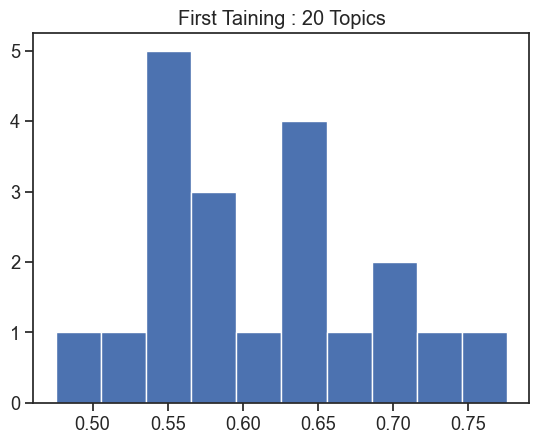

In [62]:
# It is clear to look at the distribution of coherence scores to compare different trainings
# draw the histogram for the first training
plt.hist(coherence_per_topic_1 )
plt.title('First Taining : 20 Topics')

Text(0.5, 1.0, 'Second Training : 30 Topics')

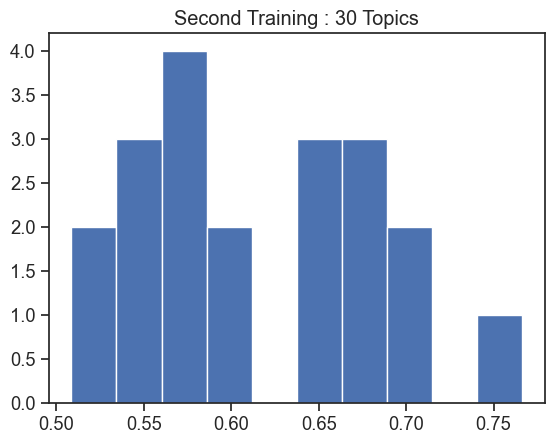

In [61]:
# draw the histogram for the second training
plt.hist(coherence_per_topic_2 )
plt.title('Second Training : 30 Topics')

### Q6. Interpret topic coherence

Report the following:
- number of topics you initially used to train the model and the coherence score you got
- changes made to the number of topics and new coherence scores obtained

# Q6 (words)
Both training sessions had similar average coherence scores. The first, with 20 topics, averaged 0.609, while the second, with 30 topics, slightly surpassed it with an average of 0.613. However, when we looked at the coherence scores for individual topics, we found that the first training had a wider range, from 0.537 to 0.776, compared to the narrower range of 0.509 to 0.766 in the second training.7351799

### X1. Optional question 1
(This question is not compulsory, it only allows you to get an extra point.)

Create a function to plot the average coherence for models with different number of topics.

In [69]:
# X1 (code)
# get the average coherence for models with different number of topics
def average_coherence_topic(num_topics, training_data):
    # Numer of topic words to print out
    num_topic_words = 10
    
    # Intialize the model
    model = tp.LDAModel(k=num_topics)
    
    # Add each document to the model, after splitting it up into words
    for text in training_data:
        model.add_doc(text.strip().split())   
    
    # Train the model by iterating over the data 10 times
    iterations = 10
    for i in range(0, 100, iterations):
        model.train(iterations)

    # calculate the topic coherence
    coh = tp.coherence.Coherence(model, coherence='c_v')
    average_coherence = coh.get_score()

    return average_coherence

In [70]:
# Define the list of numbers of topics
num_topics_list = [10, 15, 20, 25, 30]

# Collect average coherence scores for each number of topics
average_coherences = []
for num_topics in num_topics_list:
    average_coherence = average_coherence_topic(num_topics, training_data)
    average_coherences.append(average_coherence)

# Create a DataFrame to hold the data
df = pd.DataFrame({
    'Number of Topics': num_topics_list,
    'Average Coherence Score': average_coherences
})

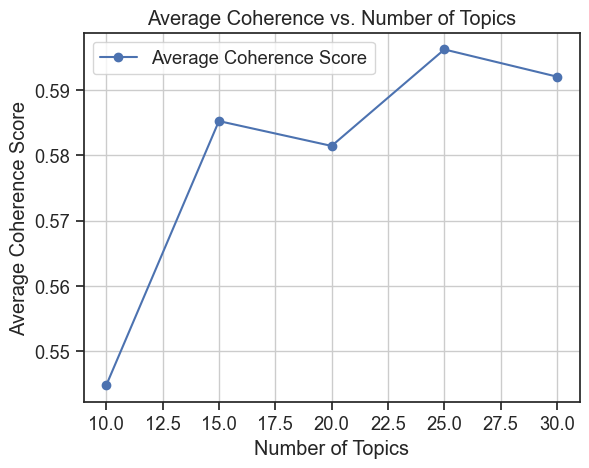

In [71]:
# Plot results  
ax = df.plot(x='Number of Topics', y='Average Coherence Score', marker='o', linestyle='-')
ax.set_title('Average Coherence vs. Number of Topics')
ax.set_xlabel('Number of Topics')
ax.set_ylabel('Average Coherence Score')
ax.grid(True)

Each training session produces a different plot, but they generally exhibit a consistent trend: the coherence score tends to increase with a higher number of topics.

### Q7. Topic distributions
Calculate the topic distributions for all tweets and get the top documents for some topics (between 2 and 5) that you think could be more representative of Sanders or Trump.

In [76]:
# Q7a (code)
# Load topic distributions for the first training (20 topics)
topic_distributions = [list(doc.get_topic_dist()) for doc in model_1.docs]

In [82]:
# Display the result in beautiful Markdown format
def make_md(string):
    display(Markdown(str(string)))
    
# Get the top 6 documents for each topic
def get_top_docs(docs, topic_distributions, topic_index_display, n = 6):
    topic_index = topic_index_display - 1

    sorted_data = sorted([(_distribution[topic_index], _document)
                          for _distribution, _document
                          in zip(topic_distributions, docs)], reverse=True)

    topic_words = topics[topic_index]

    make_md(f"### ✨Topic {topic_index_display}✨\n\n{topic_words}\n\n")
    print("---")

    for probability, doc in sorted_data[:n]:
        # Make topic words bolded
        for word in topic_words.split():
            if word in doc.lower():
                doc = re.sub(f"\\b{word}\\b", f"**{word}**", doc, re.IGNORECASE)

        make_md(f'✨  \n**Topic Probability**: {probability}  \n**Document**: {doc}\n\n')

    return
    


In [83]:
# Display top 6 documents for topic 8
get_top_docs(titles, topic_distributions, 8)

# Display top 6 documents for topic 9
get_top_docs(titles, topic_distributions, 9)

# Display top 6 documents for topic 10
get_top_docs(titles, topic_distributions, 10)

### ✨Topic 8✨

news fake media foxnews cnn new story times book like



---


✨  
**Topic Probability**: 0.9189172983169556  
**Document**: @realDonaldTrump_1271272965703753729



✨  
**Topic Probability**: 0.9018188714981079  
**Document**: @realDonaldTrump_1165068170681606144



✨  
**Topic Probability**: 0.883373498916626  
**Document**: @realDonaldTrump_1256683935444226048



✨  
**Topic Probability**: 0.8805786967277527  
**Document**: @realDonaldTrump_1248591409743003650



✨  
**Topic Probability**: 0.8755820393562317  
**Document**: @realDonaldTrump_915523382686478337



✨  
**Topic Probability**: 0.8666749596595764  
**Document**: @realDonaldTrump_930305984077156352



### ✨Topic 9✨

health care people must right americans country need every american



---


✨  
**Topic Probability**: 0.9229184985160828  
**Document**: SenSanders_1087116169528700928



✨  
**Topic Probability**: 0.919562578201294  
**Document**: SenSanders_1116089806507917312



✨  
**Topic Probability**: 0.9159010648727417  
**Document**: SenSanders_1265990605605240832



✨  
**Topic Probability**: 0.9118903279304504  
**Document**: SenSanders_1160933789348040704



✨  
**Topic Probability**: 0.907477855682373  
**Document**: SenSanders_944958232061272064



✨  
**Topic Probability**: 0.9026001691818237  
**Document**: SenSanders_1236282955271524352



### ✨Topic 10✨

great china good many big much country people trade deal



---


✨  
**Topic Probability**: 0.925896942615509  
**Document**: @realDonaldTrump_1127965568747933696



✨  
**Topic Probability**: 0.925896942615509  
**Document**: @realDonaldTrump_1127898588565135360



✨  
**Topic Probability**: 0.9063637256622314  
**Document**: @realDonaldTrump_1145726440815693826



✨  
**Topic Probability**: 0.8953272104263306  
**Document**: @realDonaldTrump_880563788705148928



✨  
**Topic Probability**: 0.8887722492218018  
**Document**: @realDonaldTrump_1337772511870799872



✨  
**Topic Probability**: 0.8813414573669434  
**Document**: @realDonaldTrump_901797906046439426



Interpret the results above. Are there topics that have top tweets only by one politician? Why do you think these topics are more representative of one of the two politicians' views?

# Q7b (words)
Yes. When we analyze topics 8 to 10, we notice that the top six tweets belong to Donald Trump in topic 8 and 10, whereas Bernie Sanders' tweets exclusively dominate topic 9.

Topic 8 includes keywords like "fake news," "media," and specific news outlets such as "Fox News" and "CNN," which align with Donald Trump's views. He's known for criticizing the media and labeling unfavorable coverage as "fake news," while favoring news outlets like Fox News.

Similarly, topic 10 is also indicative of Trump, as it includes keywords like "China," "trade deal," and "country," which align with Trump's emphasis on renegotiating trade agreements, particularly with China, and prioritizing what he perceives as the interests of the United States in trade matters.

However, topic 9 is more like something Bernie Sanders would talk about because it's all about healthcare and helping people. The words in this topic, like "healthcare," "Americans," and "need," show that it's focused on making sure everyone has access to healthcare and other important things they need. This fits with Bernie Sanders' long-time push for better healthcare for everyone.


## Large scale analysis

### Q8. Create a random sample of the whole dataset and visualize the topic distributions for the sampled tweets

In [84]:
# Crete a sample of tweets
target_labels = sample(titles,100)

In [102]:
# Q8 (code)
# Create a heatmap using the random sample
# Tip: to display more than 20 tweets you have to change the values of `dim =` in sns.heatmap()

sns.set(style='ticks', font_scale=1.2)
def plot_categories_by_topics_heatmap(labels,
                                      topic_distributions,
                                      topic_keys,
                                      output_path=None,
                                      target_labels=None,
                                      color_map = sns.cm.rocket_r,
                                      dim=None):

    # Combine the labels and distributions into a list of dictionaries.
    dicts_to_plot = []
    for _label, _distribution in zip(labels, topic_distributions):
        if not target_labels or _label in target_labels:
            for _topic_index, _probability in enumerate(_distribution):
                dicts_to_plot.append({'Probability': float(_probability),
                                      'Category': _label,
                                      'Topic': 'Topic ' + str(_topic_index+1).zfill(2) + ': ' + ' '.join(topic_keys[_topic_index][:5])})

    # Create a dataframe, format it for the heatmap function, and normalize the columns.
    df_to_plot = pd.DataFrame(dicts_to_plot)
    df_wide = df_to_plot.pivot_table(index='Category',
                                     columns='Topic',
                                     values='Probability')
    df_norm_col=(df_wide-df_wide.mean())/df_wide.std()

    # Show the final plot.
    if dim:
        plt.figure(figsize=dim)
    sns.set(style='ticks', font_scale=1.2)
    ax = sns.heatmap(df_norm_col, cmap=color_map)
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    plt.xticks(rotation=30, ha='left')
    plt.tight_layout()
    plt.savefig('plot_sample_100.png') # save the picture
    plt.show()
    return df_norm_col

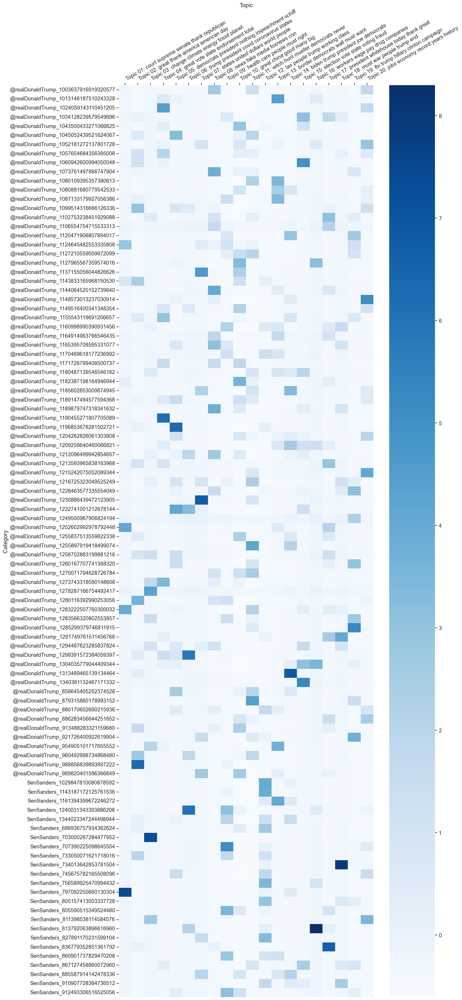

In [104]:
df_sample_normal = plot_categories_by_topics_heatmap(titles,
                                  topic_distributions,
                                  topic_individual_words,
                                  target_labels=target_labels,
                                  color_map = 'Blues',
                                 dim=(16, 35))

### Q9. Interpret the heatmap
Do you see any pattern in the probability distributions of topics for each politician?

Are there topics that are more likely for one of the two politicians?

# Q9 (words)
The plot is too long for easy comparison, and the colors aren't showing clear patterns. Therefore, we can sum the normalized probability distributions for each topic for each politician.

In [116]:
# Separate data by policians
trump = df_sample_normal[df_sample_normal.index.str.contains('Trump')]
sanders = df_sample_normal[df_sample_normal.index.str.contains('Sanders')]

In [130]:
# Add up the probabilities of tweets falling under each topic
def Probability_Topic(df):
    sums = [(col, df[col].sum()) for col in df.columns]
    sorted_sums = sorted(sums, key=lambda x: x[1], reverse=True)
    
    print("Sum of each topic:")
    for topic, sum_value in sorted_sums:
        print(f"{topic}: {sum_value}")

In [131]:
# Add up probability of each topic for Trump
Probability_Topic(trump)

Sum of each topic:
Topic 11: witch hunt mueller democrats never: 10.328192117119034
Topic 08: news fake media foxnews cnn: 9.301963752793458
Topic 10: great china good many big: 7.644200397857443
Topic 04: great vote state endorsement total: 7.308409823527343
Topic 19: fbi trump hillary clinton campaign: 6.3593699149148035
Topic 05: democrats president nothing impeachment schiff: 6.1629689104688845
Topic 02: great thank america american day: 5.261796621367542
Topic 15: election vote state voting fraud: 4.454490661320339
Topic 07: states united dollars world people: 2.643551518778882
Topic 20: jobs economy record years history: 2.4271216553997546
Topic 13: border democrats wall must want: 1.7877743531211217
Topic 14: biden trump president joe democrats: 1.1610458126574048
Topic 17: president whitehouse today thank great: 0.05994658386636853
Topic 01: court supreme senate thank republican: -2.5265152168466605
Topic 06: trump president covid coronavirus states: -2.73062914475636
Topic 03:

In [132]:
# Add up probability of each topic for Sanders
Probability_Topic(sanders)

Sum of each topic:
Topic 12: tax people trump working class: 25.07209313644084
Topic 09: health care people must right: 14.81978979692586
Topic 18: must war people trump end: 6.304665823447385
Topic 16: workers wage pay drug companies: 5.363996090453504
Topic 03: change climate energy fossil planet: 4.097922321552325
Topic 06: trump president covid coronavirus states: 2.7306291447563593
Topic 01: court supreme senate thank republican: 2.5265152168466614
Topic 17: president whitehouse today thank great: -0.059946583866369973
Topic 14: biden trump president joe democrats: -1.1610458126574024
Topic 13: border democrats wall must want: -1.7877743531211219
Topic 20: jobs economy record years history: -2.4271216553997546
Topic 07: states united dollars world people: -2.6435515187788816
Topic 15: election vote state voting fraud: -4.454490661320342
Topic 02: great thank america american day: -5.261796621367544
Topic 05: democrats president nothing impeachment schiff: -6.162968910468885
Topic 

Topics 11, 8, 10, 4, 19, 5, 2, 15, 7, and 20 exhibit a higher probability in Trump's tweets. Topics 13, 14, and 17 show slightly higher probabilities in Trump's tweets as well. The remaining topics appear to be more closely associated with Bernie Sanders. However, due to an uneven distribution of samples between the two politicians, we observe a higher number of topics for Trump.

### X2. Optional question 2
(This question is not compulsory, it only allows you to get an extra point)

Make the sample balanced, with 50 tweets by Trump and 50 by Sanders.

In [89]:
# X2 (code)
sanders_sample = sanders['Title'].sample(n=50, random_state=42)
trump_sample = trump['Title'].sample(n=50, random_state=42)
target_labels =  pd.concat([sanders_sample,trump_sample])

In [91]:
# check the samples
# Count the number of labels containing 'trump'
count_trump_labels = target_labels.str.contains('trump', case=False).sum()
# Display the count
print("Number of labels containing 'trump':", count_trump_labels)

Number of labels containing 'trump': 50


### X3. Optional question 3
(This question is not compulsory, it only allows you to get an extra point)

Extend the analysis to all the tweets in the dataset.

In [182]:
# X3 (code and words)
# Tip: plotting a heatmap for thousands of tweets is not practical.
# Make a comparison based on the numerical values in the `df_norm_col` dataframe (see Week 6 notebook)

# Load topic distributions for the first training (20 topics)
topic_distributions = [list(doc.get_topic_dist()) for doc in model_1.docs] 

# Combine the labels and distributions into a list of dictionaries.
dicts_to_plot = []
for _label, _distribution in zip(titles, topic_distributions):
    for _topic_index, _probability in enumerate(_distribution):
        dicts_to_plot.append({'Probability': float(_probability),
                              'Category': _label,
                              'Topic': 'Topic ' + str(_topic_index+1).zfill(2) + ': ' + ' '.join(topic_individual_words[_topic_index][:5])})

# Create a dataframe, format it for the heatmap function, and normalize the columns.
df_to_plot = pd.DataFrame(dicts_to_plot)
df_wide = df_to_plot.pivot_table(index='Category',
                                 columns='Topic',
                                 values='Probability')
df_norm_col=(df_wide-df_wide.mean())/df_wide.std()

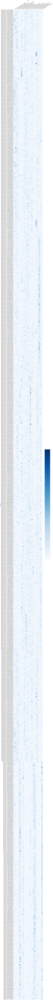

In [218]:
# Show the final plot.
plt.figure(figsize=(16,300))
sns.set(style='ticks', font_scale=1.2)
ax = sns.heatmap(df_norm_col, cmap='Blues')
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
plt.xticks(rotation=30, ha='left')
plt.tight_layout()
plt.savefig('plot_sample_all.png') # save the picture
plt.show()